# Calculate 2-point correlations as function of separation

We study **two-point correlation functions** of scalar fields on organoid surfaces.  
Each organoid is represented as a triangular mesh. Distances between vertices are computed using:

- **Heat method (Crane et al. 2013):** smooth geodesic approximation.  
- **Dijkstra (graph geodesic):** shortest path along mesh edges, used for comparison.  

To make correlations efficient:  
1. **Coarse-grain** vertices with farthest-point sampling.  
2. **Precompute distance bins** between vertex pairs.  
3. **Accumulate correlations per bin**, weighted by vertex areas.  

This yields normalized two-point functions of fields (e.g. HKS), revealing characteristic length scales of variation across the organoid surface.


In [33]:
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from src.OrganoidMesh import OrganoidMesh
from src.mesh_analysis import *
from src.nonlocal_correlations import *
from src.cell_graph_functions import *

## Load organoid mesh, extract and filter marker fields

For illustration purposes we just treat a single organoid 

In [ ]:
data_dir = '../NicoleData/20250929/fractal_output'

# choose one timepoint/well/round
# timepoint = "day4p5-more" # "day4p5"
# zarr_name = "r0.zarr"
# well = "C01" # "A06"
# round_name = "0_fused_zillum_registered"
# organoid_id = 14  # 19 # example

timepoint = "day4p5"
zarr_name = "r0.zarr"
well = "A06"
round_name = "0_fused_zillum_registered"
organoid_id = 19 # example

path = f"{data_dir}/{timepoint}/{zarr_name}/{well[0]}/{well[1:]}/{round_name}/meshes/nnorg_linked_multi_annotated_class/{organoid_id}.vtp"


mesh = OrganoidMesh()
mesh.load_mesh_from_file(path)
mesh.align_with_pca()
_ = mesh.compute_spectral_coefficients(lmax=15)    # must populate m.eigvals, m.eigvecs

print(mesh.v.shape)

ValueError: Reference field '4.label' not found in raw field names.

Extracting the fate marker intensity fields - the binary fields (0/1 indicating whether a cell is positive for a given expression) will be computed after coarse-graining.

In [ ]:
from plotly.subplots import make_subplots

print(mesh.marker_names)

# --- Markers to plot ---
marker_list = ["Serotonin", "Lysozyme", "LGR5"]

# --- Get their indices ---
marker_indices = [mesh.marker_names.index(name) for name in marker_list]

# --- Create subplot figure ---
fig = make_subplots(
    rows=1, cols=len(marker_list),
    specs=[[{'type': 'mesh3d'}] * len(marker_list)],
    subplot_titles=marker_list
)

# --- Add each marker as a Mesh3d trace ---
for i, (name, idx) in enumerate(zip(marker_list, marker_indices), start=1):
    fig.add_trace(
        go.Mesh3d(
            x=mesh.v[:, 0], y=mesh.v[:, 1], z=mesh.v[:, 2],
            i=mesh.f[:, 0], j=mesh.f[:, 1], k=mesh.f[:, 2],
            intensity=mesh.marker_fields[:, idx],
            colorscale='Viridis',
            showscale=True,
            name=name
        ),
        row=1, col=i
    )

# --- Adjust layout ---
for j in range(len(marker_list)):
    fig.update_layout(**{f"scene{'' if j == 0 else j+1}": dict(aspectmode='data')})

fig.update_layout(
    title_text="Marker intensity maps: Serotonin, Lysozyme, LGR5",
    showlegend=False
)

fig.show()

['LGR5', 'Chromogranin A', 'Cyclin D', 'Mucin 2', 'AldoB', 'Glucagon', 'Cyclin A', 'Agr2', 'Serotonin', 'Lysozyme']


## Calculate and plot Heat Kernel Signature (HKS)

The **heat kernel signature (HKS)** is a pointwise descriptor of a surface, defined from the eigendecomposition of the Laplace–Beltrami operator.

Let $\Delta$ be the Laplace–Beltrami operator on the surface,  and $\{ \lambda_i, \phi_i \}_{i=0}^{\infty}$ be its eigenvalues and eigenfunctions, satisfying  
$$
\Delta \phi_i = \lambda_i \phi_i,
$$
Then the heat kernel is  
$$
K_t(x,y) = \sum_{i=0}^\infty e^{-\lambda_i t} \, \phi_i(x) \, \phi_i(y),
$$
and the **heat kernel signature at time $t$** is defined as the diagonal of the kernel:  
$$
\mathrm{HKS}_t(x) = K_t(x,x) 
= \sum_{i=0}^\infty e^{-\lambda_i t} \, \phi_i(x)^2.
$$
In practice, the sum is truncated to the first $k$ eigenpairs $(\lambda_i, \phi_i)$. The parameter $t$ controls the scale - here we use $t=1$, that is, the time-scale is on the same order as the cell size.

The HKS acts as a proxy of the Gaussian curvature, as regions with large Gaussian curvatures generally have high heat kernel function value while the regions with small (negative) curvatures have low function values. However, following its definition, the HKS is strictly positive. Thus, if we want to identify regions with negative curvature (such as the neck of a crypt), particularly in correlations, we might need to rescale or offset the HKS. Below are a few possible solutions:


In [ ]:
hks, hks_coeffs = compute_hks(mesh, t=[1.0]) # HKS at time-scale comparable to cell size
hks_asymp = compute_hks(mesh, t=[1e8], coeffs=False) # asymptotic HKS (total surface area dependent) 
hks_mean = np.mean(hks)

print(f"Asymptotic HKS = {hks_asymp}")
print(f"Mean HKS = {hks_mean}")

hks_removed_l0,_ = mesh.remove_lowest_modes(coeffs=hks_coeffs, l_remove=1)

Asymptotic HKS = [[0.00262845]
 [0.00262845]
 [0.00262845]
 ...
 [0.00262845]
 [0.00262845]
 [0.00262845]]
Mean HKS = 0.0804858045387445


In [ ]:
from plotly.subplots import make_subplots

# Create subplot with 1 row, 2 columns for 3D plots
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{'type':'scene'}, {'type':'scene'}],
           [{'type':'scene'}, {'type':'scene'}]],
    subplot_titles=("HKS(t=1)", "HKS(t=1) - HKS(t=inf)", "HKS(t=1) - <HKS>", "HKS(t=1), (only l>0)")
)

# First 3D mesh
fig.add_trace(
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=hks,
        colorscale='RdBu_r',
        colorbar=dict(x=0.45, y=0.8, len=0.5),  # position within left subplot
        name="Surface",
    ),
    row=1, col=1,
)
fig.add_trace(
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=hks - hks_asymp,
        colorscale='RdBu_r',
        colorbar=dict(x=0.9, y=0.8, len=0.5),  # position within left subplot
        name="Surface",
    ),
    row=1, col=2,
)
fig.add_trace(
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=hks-hks_mean,
        colorscale='RdBu_r',
        colorbar=dict(x=0.45, y=0.2, len=0.5),  # position within left subplot
        name="Surface",
        cmin=-np.max(np.abs(hks-hks_mean)),
        cmax=np.max(np.abs(hks-hks_mean))
    ),
    row=2, col=1,
)
fig.add_trace(
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=hks_removed_l0,
        colorscale='RdBu_r',
        colorbar=dict(x=0.9, y=0.2, len=0.5),  # position within left subplot
        name="Surface",
        cmin=-np.max(np.abs(hks_removed_l0)),
        cmax=np.max(np.abs(hks_removed_l0))
    ),
    row=2, col=2,
)

fig.update_layout(height=750, width=1200, title_text="Multiple 3D Figures")
fig.show()

## Coarse-grain to cell-level

To limit the computations needed for calculating correlations, we coarse-grain the vertex mesh, selecting the surface centroid of each cell. Additionally, we compute some quantities averaged over the surface area of each cell.

Note, for computing geodesic distances between the coarse-grained points, we still need the full mesh.

In [ ]:
fields_mesh = np.concatenate([hks, hks_removed_l0], axis=1) # gather the fields we want to study

cell_center_vertices = mesh.get_centroid_vertices() # get indices of patch centers

centroids, cell_areas, cell_weighted_fields, _ = mesh.compute_cell_statistics(fields_mesh) # coarse-grain
fields_cell = fields_mesh[cell_center_vertices, :]
markers_cell = mesh.marker_fields[cell_center_vertices, :]

print(cell_center_vertices.shape)  # {label: vertex_index}

(590,)


In [ ]:
fig = go.Figure(data=[
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=mesh.cell_label_field,
        colorscale='Viridis',
        showscale=True,   # adds colorbar
        name="Surface"
    ),
    go.Scatter3d(
        # x=centroid_coords[:,0], y=centroid_coords[:,1], z=centroid_coords[:,2],
        x=mesh.v[cell_center_vertices,0], y=mesh.v[cell_center_vertices,1], z=mesh.v[cell_center_vertices,2],
        mode='markers',
        marker=dict(size=6, color='red', symbol='circle'),
        name="Source vertex"
    ),
    go.Scatter3d(
        # x=centroid_coords[:,0], y=centroid_coords[:,1], z=centroid_coords[:,2],
        x=centroids[:,0], y=centroids[:,1], z=centroids[:,2],
        mode='markers',
        marker=dict(size=6, color='blue', symbol='circle'),
        name="Centroid coordinates"
    )
])

fig.update_layout(
    scene=dict(aspectmode='data'),
    title="Patch centers (red) vs cell centroids (blue)"
)

fig.show()


## Calculate geodesics using the Heat Method (Crane et al., 2013)

The **heat method** provides a fast and robust way to approximate geodesic distances on a surface mesh using standard linear algebra operations.  
It is based on the observation that the gradient of a short-time heat diffusion encodes information about geodesic directions.

Given a triangular mesh with Laplace–Beltrami operator $\Delta$ and mass matrix $M$, the method proceeds in three steps:

1. **Diffuse heat from a source**  
   Solve the heat equation for short time $t$ with a delta source at vertex $s$:  

   $$
   (M + tL)\,u = M \delta_s,
   $$

   where $L$ is the cotangent Laplacian, $M$ the lumped mass matrix, and $\delta_s$ a unit impulse at the source vertex.

2. **Compute normalized gradient vector field**  
   Evaluate $\nabla u$ per face, then normalize to obtain a unit vector field pointing away from the source:  

   $$
   X = -\frac{\nabla u}{\lVert \nabla u \rVert}.
   $$

3. **Recover distance by solving a Poisson equation**  
   Enforce integrability by solving  

   $$
   \Delta \phi = \nabla \cdot X,
   $$

   where $\phi$ is the geodesic distance function.  
   Finally, shift $\phi$ so that $\phi(s) = 0$ at the source.


**Advantages:**  
- Converts geodesic computation into two sparse linear solves.  
- Robust to mesh irregularity.  
- Much faster than exact methods (e.g. MMP algorithm) while maintaining high accuracy.  

---

In practice, we use the centermost vertex of each cell as source, whereby we obtain the distance between said sources and all other points of the mesh. From this we can select just the geodesic distances to each other cell centers.

In [ ]:
# Calculate geodesics using heat method (Crane et al. 2013)
dist_heat_all = compute_geodesics(mesh, t=None, sources=cell_center_vertices)  # (S,V)

heat sources: 100%|██████████| 590/590 [00:02<00:00, 216.15it/s]


In [ ]:
def build_edge_graph(v: np.ndarray, f: np.ndarray) -> sparse.csr_matrix:
    """Build symmetric adjacency (V x V) sparse matrix with Euclidean edge lengths as weights.
    Only edges present in faces are added.
    """
    V = v.shape[0]
    # collect edges
    I = []
    J = []
    W = []
    for tri in f:
        for a, b in ((0,1),(1,2),(2,0)):
            i = tri[a]; j = tri[b]
            if i == j: continue
            I.append(i); J.append(j)
            W.append(np.linalg.norm(v[i]-v[j]))
            # also add reverse
            I.append(j); J.append(i)
            W.append(np.linalg.norm(v[i]-v[j]))
    A = sparse.csr_matrix((W, (I, J)), shape=(V, V))
    # if multiple duplicate edges, keep smallest weight
    A.data[np.isnan(A.data)] = 0.0
    return A

def geodesic_dijkstra_all_sources(edge_adj: sparse.spmatrix, sources: np.ndarray = None):
    """Compute geodesic distances on mesh (edge-graph) from one or more sources.
    Uses SciPy's csgraph.dijkstra. If sources is None, compute all-pairs distances
    (be careful with memory for V>2000).

    Returns: D (S x V) if sources provided, else (V x V)
    """
    if sources is None:
        # all-pairs
        D = csgraph.dijkstra(edge_adj, directed=False)
        return D
    else:
        D = csgraph.dijkstra(edge_adj, directed=False, indices=sources)
        return D

In [ ]:
# For comparison we calculate distances with Dijkstra
edge_graph = build_edge_graph(mesh.v, mesh.f)
dist_graph_all = geodesic_dijkstra_all_sources(edge_graph, sources=cell_center_vertices)

In [ ]:
# select just the subset pairs
dist_heat = dist_heat_all[:, cell_center_vertices] # (S,S)
dist_graph = dist_graph_all[:, cell_center_vertices]

print(dist_heat_all.shape)
print(dist_heat.shape)

(590, 18001)
(590, 590)


For computing correlations etc. as function of distance, we gather each pair of cell-center points $(i,j)$ and bin them according to the geodesic distance between them $d$. Additionally, we can include information about the surface areas of the corresponding cells, which is needed for computing surface-integral-style correlations rather than lattice-style.

In [ ]:
# --- binning parameters ---
dmax = 0.99*np.max(dist_heat)
nbins = 64
bin_edges = np.linspace(0.0, dmax, nbins + 1)
bin_centers = 0.5*(bin_edges[:-1] + bin_edges[1:])

# bin pairs (i,j) by distance d between them
bins_dist_weighted = pair_bins_by_distance(dist_heat, cell_areas, bin_edges, use_area_weights=True) # with area weights
bins_dist_equal = pair_bins_by_distance(dist_heat, cell_areas, bin_edges, use_area_weights=False) # without


Calculate bins for Dijstra as well, just to compare.

Plotting the geodesic distances vs graph distances, shows similar distribution but the latter having larger values. This is to be expected, as Dijkstra calculates cummulative distance through the edges, while the heat method approximates the geodesics.

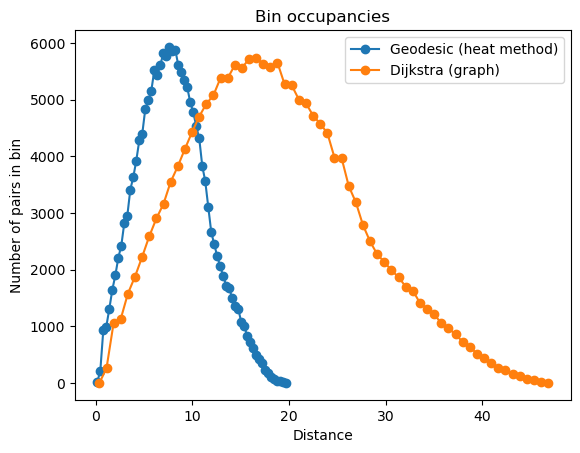

In [ ]:
dmax_graph = 0.99*np.max(dist_graph)
nbins = 64
bin_edges_graph = np.linspace(0.0, dmax_graph, nbins + 1)
bin_centers_graph = 0.5*(bin_edges_graph[:-1] + bin_edges_graph[1:])

bins_dist_graph = pair_bins_by_distance(dist_graph, cell_areas, bin_edges_graph, use_area_weights=False) # just for comparison

counts_dist = [len(bins_dist_weighted[f"I_{b}"]) for b in range(len(bin_edges)-1)]
counts_dist_graph = [len(bins_dist_graph[f"I_{b}"]) for b in range(len(bin_edges_graph)-1)]

plt.plot(bin_centers, counts_dist, 'o-', label="Geodesic (heat method)")
plt.plot(bin_centers_graph, counts_dist_graph, 'o-', label="Dijkstra (graph)")
plt.xlabel("Distance")
plt.ylabel("Number of pairs in bin")
plt.legend()
plt.title("Bin occupancies")
plt.show()

As a final sanity check, we can plot the distance to a single point for both methods. Given the size of the organoid, it should be evident that Dijkstra gives way too large values.

In [ ]:
src_idx = 42  # single heat source

fig = go.Figure(data=[
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=dist_heat_all[src_idx, :],
        colorscale='Viridis',
        showscale=True,   # adds colorbar
        name="Surface"
    ),
    go.Scatter3d(
        x=[mesh.v[cell_center_vertices[src_idx],0]], y=[mesh.v[cell_center_vertices[src_idx],1]], z=[mesh.v[cell_center_vertices[src_idx],2]],
        mode='markers',
        marker=dict(size=6, color='red', symbol='circle'),
        name="Source vertex"
    )
])

fig.update_layout(
    scene=dict(aspectmode='data'),
    title="Geodesic distances (Heat method) wrt single point"
)

fig.show()


## Calculate correlations on cell grid

The first step is to figure out the correct normalization for the fields and the correlations. 

Let bin $b$ contain unordered pairs $(i,j)$, with $i < j$, chosen such that the geodesic distance $d(i,j)$ lies within the range of the bin. The two-point correlation of fields $F^k$ and $F^l$ can then be calculated within a given bin using:

**Surface-integral (area-weighted) approach**
$$ C_b^{k l} = Z_b^{-1} \sum_{(i,j)\in r} a_i a_j F_i^k F_j^l$$
where $Z_b = \sum_{(i,j)\in r} a_i a_j$ and $a_i$ is the surface area of surface area associated to sample $i$.


**Lattice (equal-weight) approach**
$$ C_b^{k l} = N_b^{-1} \sum_{(i,j)\in r}  F_i^k F_j^l$$
where $N_b$ is the number of unordered pairs in bin $b$.


If cell areas are nonuniform, the lattice estimator equals the area-weighted estimator only if either
1. $a_i \approx \mathrm{const}$ (which is the case for fate markers), or
2. the field $\mathbf{F}$ is uncorrelated with $\mathbf{a}$ (i.e. the distribution of $\mathbf{F}$ is independent of cell area)
Otherwise the lattice estimator is a biased approximation to the surface integral.


** Connected correlations**
The raw two-point correlation C_b^{kl} contains both genuine correlations and a trivial baseline from the global means.  
To isolate fluctuations, we define the connected correlation:

$$C_{b,conn}^{kl} = C_b^{kl} - \mu^k \mu^l $$

with global means

- Surface (area-weighted): $\mu^k = (\sum_i a_i F_i^k) / (\sum_i a_i)$  
- Lattice (equal-weight): $\mu^k = (1/V) \sum_i F_i^k $

Normalization difference:  
- Raw C_b^{kl} is normalized per-bin (Z_b or N_b).  
- The subtraction uses global means, independent of bin.  

Thus, uncorrelated fields yield C_{b,conn}^{kl} ≈ 0, while any nontrivial spatial structure remains visible.


**In this section**

To determine which approach is best, we run a few tests:

1. Compare area-weighted and equal-weighted correlation for **synthetic fields**
2. Compare for the **physical fields** (here just for a single organoid)


### Generate synthetic scalar field for correlation testing

In [ ]:
def generate_sinusoidal_field(v: np.ndarray, k: float = 5.0, direction: np.ndarray = None) -> np.ndarray:
    """
    Generate a synthetic sinusoidal scalar field on a mesh.
    
    Args:
        v : ndarray (V,3)
            Vertex coordinates.
        k : float
            Wavenumber. Higher k = shorter wavelength.
        direction : ndarray (3,), optional
            Direction vector along which to define the sinusoid.
            Defaults to x-axis.
    
    Returns:
        field : ndarray (V,)
            Scalar field values at each vertex.
    """
    if direction is None:
        direction = np.array([1.0, 0.0, 0.0])
    direction = direction / np.linalg.norm(direction)
    
    # Project vertices onto direction
    proj = v @ direction
    # Sine wave along that direction
    field = np.sin(k * proj)
    return field


def generate_gaussian_bump_field(v: np.ndarray, center_idx: int = 0, sigma: float = 0.1) -> np.ndarray:
    """
    Generate a localized Gaussian bump field on the mesh.
    
    Args:
        v : ndarray (V,3)
            Vertex coordinates.
        center_idx : int
            Index of vertex to use as Gaussian center.
        sigma : float
            Width (standard deviation) of the Gaussian in Euclidean space.
    
    Returns:
        field : ndarray (V,)
            Scalar field values at each vertex.
    """
    center = v[center_idx]
    dists = np.linalg.norm(v - center[None,:], axis=1)
    field = np.exp(-0.5 * (dists / sigma)**2)
    return field


In [ ]:
# Generate a synthetic test field on the organoid
field_sin = generate_sinusoidal_field(mesh.v, k=3.0)        # sinusoidal
field_gauss = generate_gaussian_bump_field(mesh.v, center_idx=500, sigma=6.0) # Gaussian bump


fig = go.Figure(data=[
    go.Mesh3d(
        x=mesh.v[:,0], y=mesh.v[:,1], z=mesh.v[:,2],
        i=mesh.f[:,0], j=mesh.f[:,1], k=mesh.f[:,2],
        intensity=field_sin,
        colorscale='Viridis',
        showscale=True,   # adds colorbar
        name="Surface"
    )
])

fig.update_layout(
    scene=dict(aspectmode='data'),
    title="Synthetic field for correlation testing"
)

fig.show()

In [ ]:
X = np.stack([field_sin[cell_center_vertices], field_gauss[cell_center_vertices]], axis=1)  # shape (V,2)

# Accumulate correlations
Cw_synth, Cw_synth_conn, _, _ = compute_two_point_correlations(bins_dist_weighted, X) # compute surface area weighted correlations
Ce_synth, Ce_synth_conn, _, _ = compute_two_point_correlations(bins_dist_equal, X) # compute equal weighted correlations

print(Cw_synth.shape)


(64, 2, 2)


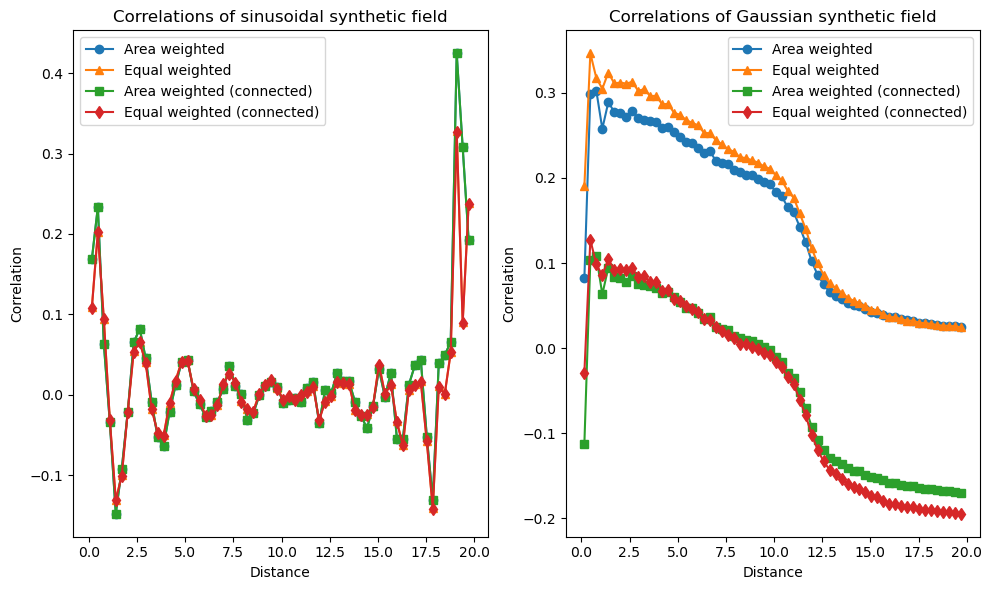

In [ ]:
plt.figure(figsize=(10,6))

plt.subplot(1,2,1)
plt.plot(bin_centers, Cw_synth[:,0,0], 'o-', label="Area weighted")
plt.plot(bin_centers, Ce_synth[:,0,0], '^-', label="Equal weighted")
plt.plot(bin_centers, Cw_synth_conn[:,0,0], 's-', label="Area weighted (connected)")
plt.plot(bin_centers, Ce_synth_conn[:,0,0], 'd-', label="Equal weighted (connected)")
plt.xlabel("Distance")
plt.ylabel("Correlation")
plt.title("Correlations of sinusoidal synthetic field")
plt.legend()

plt.subplot(1,2,2)
plt.plot(bin_centers, Cw_synth[:,1,1], 'o-', label="Area weighted")
plt.plot(bin_centers, Ce_synth[:,1,1], '^-', label="Equal weighted")
plt.plot(bin_centers, Cw_synth_conn[:,1,1], 's-', label="Area weighted (connected)")
plt.plot(bin_centers, Ce_synth_conn[:,1,1], 'd-', label="Equal weighted (connected)")
plt.xlabel("Distance")
plt.ylabel("Correlation")
plt.title("Correlations of Gaussian synthetic field")
plt.legend()

plt.tight_layout()
plt.show()

### Auto-correlation of HKS

We compute the auto-correlation function of HKS (both full and with l=0 mode removed), while testing the effects of the various weightings and averaging, namely

1. Weigh each point $i$ in the correlation according to the area of the correponding cell
2. Use the area-weighted average of the fields, rather than the value at the centermost vertex of cell patch

In [ ]:
Cw_hks, Cw_hks_conn, _, _ = compute_two_point_correlations(bins_dist_weighted, fields_cell) # compute surface area weighted correlations
Ce_hks, Ce_hks_conn, _, _ = compute_two_point_correlations(bins_dist_equal, fields_cell) # compute equal weighted correlations

Cw_hks_areamean, Cw_hks_areamean_conn, _, _ = compute_two_point_correlations(bins_dist_weighted, cell_weighted_fields) # compute surface area weighted correlations
Ce_hks_areamean, Ce_hks_areamean_conn, _, _ = compute_two_point_correlations(bins_dist_equal, cell_weighted_fields) # compute equal weighted correlations

print(Cw_hks.shape)

(64, 2, 2)


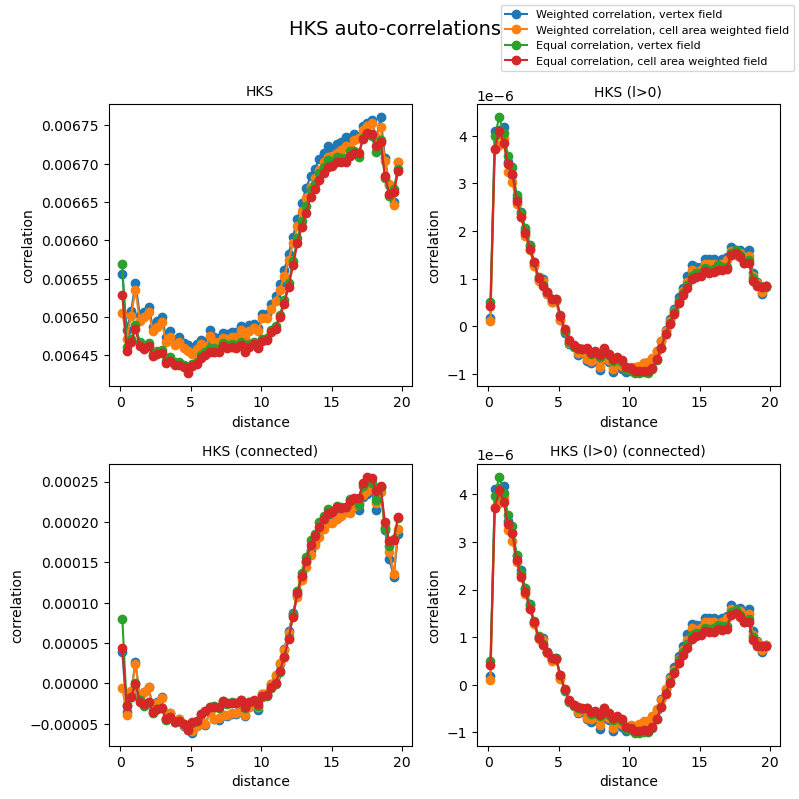

In [ ]:
corr_names = [
    ["HKS", "HKS (l>0)"],
    ["HKS (connected)", "HKS (l>0) (connected)"]
]

fig, axes = plt.subplots(2, 2, figsize=(8, 8), sharex=False, sharey=False)

# We'll store handles + labels just once
handles, labels = None, None

for i in range(2):
    for j in range(2):
        ax = axes[i, j]

        if i == 0: # auto-correlations
            h1, = ax.plot(bin_centers, Cw_hks[:,j,j], 'o-', label="Weighted correlation, vertex field")
            h2, = ax.plot(bin_centers, Cw_hks_areamean[:,j,j], 'o-', label="Weighted correlation, cell area weighted field")
            h3, = ax.plot(bin_centers, Ce_hks[:,j,j], 'o-', label="Equal correlation, vertex field")
            h4, = ax.plot(bin_centers, Ce_hks_areamean[:,j,j], 'o-', label="Equal correlation, cell area weighted field")

        else: # connected auto-correlations
            h1, = ax.plot(bin_centers, Cw_hks_conn[:,j,j], 'o-', label="Weighted correlation, vertex field")
            h2, = ax.plot(bin_centers, Cw_hks_areamean_conn[:,j,j], 'o-', label="Weighted correlation, cell area weighted field")
            h3, = ax.plot(bin_centers, Ce_hks_conn[:,j,j], 'o-', label="Equal correlation, vertex field")
            h4, = ax.plot(bin_centers, Ce_hks_areamean_conn[:,j,j], 'o-', label="Equal correlation, cell area weighted field")

        # Save handles+labels once (first subplot is enough)
        if handles is None and labels is None:
            handles, labels = ax.get_legend_handles_labels()

        # Label diagonals with field names
        ax.set_title(corr_names[i][j], fontsize=10)
        ax.set_ylabel("correlation", fontsize=10)
        ax.set_xlabel("distance", fontsize=10)

# Global labels + single legend
fig.suptitle("HKS auto-correlations", fontsize=14)
fig.legend(handles, labels, loc="upper right", fontsize=8)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### How to interpret the curves above:


Firstly, it is evident that the choice of weighting has little consequence on the results - at least for this particular organoid. We do observe a slightly more pronounces negative dip for the equal weighted (lattice) correlations. This is likely becuase cells around the neck of the crypt have smaller areas than those in the lobes, hence when weighing by area they contribute less.

The connected auto-correlation describes how fluctuations of HKS around is mean are correlated at distance:

- The connected curve starting **near 0** means local immediate neighbors have little net positive covariance once the global mean is removed.

- The **negative dip at intermediate distances (~3–10 cell lengths)** means that if a cell has a *positive* fluctuation (higher HKS than mean), then cells at that separation on average tend to have *negative* fluctuations (lower than mean). Geometrically, this is an anticorrelation radius: being high in one spot tends to be paired with being low at that distance.
In a peanut-shaped organoid: a bulge (lobe) may be surrounded by the constriction (waist) at a characteristic geodesic separation. So positive HKS on the lobe correlates with negative HKS at the waist at that separation.

- The **large positive swing at large distances** indicates that cells very far apart (on the surface) tend to have similar deviations: e.g., the two opposite lobes are both bulging and therefore both high HKS — pairs across the peanut (large geodesic separation) are positively correlated.

So the connected curve is directly showing the alternating pattern along the organoid surface: lobe (high) → waist (low) → opposite lobe (high).


Removing the lowest eigenmode removes the uniform baseline that lifts all HKS values; this **increases the relative amplitude of local deviations**. Therefore fluctuations around zero become larger in magnitude and negative regions become more pronounced.

---

**Note this interpretation was done for the particular organoid below:**

timepoint = "day4p5"

zarr_name = "r0.zarr"

well = "A06"

round_name = "0_fused_zillum_registered"

organoid_id = 19 # example


# Anchored correlation and enrichment functions

Until now we have computed correlations between all (cell center) points on the organoid surface. However, we may be interested in computing **anchored** correlations, where the distances are taken with respect to certain points of interest, e.g. cells that are Seratonin+.

In [ ]:
positive_indices, markers_cell_binary = positive_indices_and_labels(markers_cell)


bins_dist_serotonin = pair_bins_by_distance(dist_heat, cell_areas, bin_edges, 
                                            sources=positive_indices[mesh.marker_names.index("Serotonin")], 
                                            use_area_weights=False)

bins_dist_lysozyme = pair_bins_by_distance(dist_heat, cell_areas, bin_edges, 
                                            sources=positive_indices[mesh.marker_names.index("Lysozyme")], 
                                            use_area_weights=False)

### Enrichment Curve Computation

We first compute the **spatial enrichment curves** of binary cell labels (e.g., marker-positive cells) relative to a selected **source population** (e.g., serotonin^+^ cells).  

For each source element $ i $, all target elements $ j $ are grouped into **distance bins** based on their geodesic separation $ r_{ij} $.  
If area weights $ a_i $ are provided, each pair contributes a weight $ w_{ij} = a_i a_j $; otherwise, all pairs are weighted equally.

Within each distance bin $ r \in [r_b, r_{b+1}) $, the local fraction of positive target cells is computed as

$$
f_{\text{local}}(r) = 
\frac{\sum_{(i,j)\in r} w_{ij}\, L_j}{\sum_{(i,j)\in r} w_{ij}},
$$

where $L_j \in \{0,1\} $ indicates whether cell $ j $ is marker-positive.

The **global fraction** of positive cells across the organoid is similarly computed as

$$
f_{\text{global}} = 
\frac{\sum_j w_j\, L_j}{\sum_j w_j},
\quad 
w_j = \sum_i w_{ij}.
$$

The **enrichment curve** is then defined as the ratio

$$
E(r) = \frac{f_{\text{local}}(r)}{f_{\text{global}}},
$$

which measures how much more (or less) frequently marker-positive cells are found at a distance $ r $ from the source population compared to random expectation.  

- $E(r) > 1$: marker-positive cells are **enriched** near the source population.  
- $E(r) < 1$: marker-positive cells are **depleted** at that distance.  

Plotting $E(r)$ as a function of $r$ therefore reveals the **spatial organization** of cell types or features relative to the selected sources.  


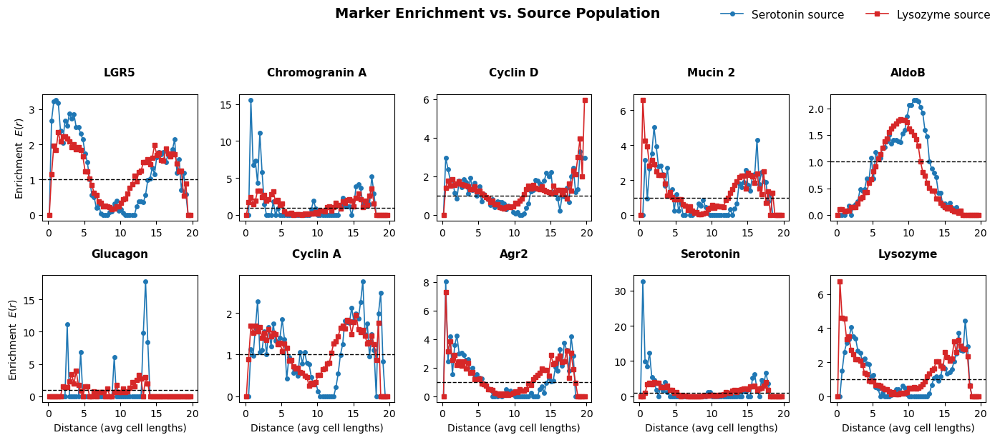

In [ ]:
# Compute enrichment for both source types
enrichment_sero, f_local_sero, f_global_sero, Ns_sero = compute_anchored_enrichment(
    bins_dist_serotonin, markers_cell_binary
)
enrichment_lyso, f_local_lyso, f_global_lyso, Ns_lyso = compute_anchored_enrichment(
    bins_dist_lysozyme, markers_cell_binary
)

# Setup figure grid
F = enrichment_sero.shape[1]  # number of target markers
ncols = 5
nrows = int(np.ceil(F / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(14, 6), sharey=False, sharex=False)
axes = axes.ravel()

colors = {"Serotonin": "#1f77b4", "Lysozyme": "#d62728"}  # blue/red color scheme

for i in range(F):
    ax = axes[i]
    # Plot enrichment for both source markers
    ax.plot(bin_centers, enrichment_sero[:, i], marker="o", color=colors["Serotonin"],
            label="Serotonin source", lw=1.2, markersize=4)
    ax.plot(bin_centers, enrichment_lyso[:, i], marker="s", color=colors["Lysozyme"],
            label="Lysozyme source", lw=1.2, markersize=4)
    
    # Reference line at E=1
    ax.axhline(1.0, color="k", linestyle="--", linewidth=1)

    # Axis labels and title
    if i % ncols == 0:
        ax.set_ylabel("Enrichment  $E(r)$")
    if i >= (nrows - 1) * ncols:
        ax.set_xlabel("Distance (avg cell lengths)")
    ax.set_title(f"{mesh.marker_names[i]}\n", fontsize=11, weight="bold")

# Hide unused axes
for j in range(F, len(axes)):
    axes[j].set_visible(False)

# Unified legend
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", ncol=2, frameon=False, fontsize=11)

# Styling
plt.suptitle("Marker Enrichment vs. Source Population", fontsize=14, weight="bold", y=1.02)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


### Anchored Radial Profile

The **anchored radial profile** quantifies how a continuous field (such as heat kernel signature) varies as a function of geodesic distance from a set of *source cells* — typically cells positive for a specific fate marker.  

Formally, for each source cell $ i $ belonging to the source set $ S $, we consider all other cells $j $ at geodesic distance $ r_{ij} $. Distances are grouped into bins, and for each distance bin centered at $ r_b $, we compute the weighted mean of the continuous field $ f_j $ evaluated at the target cells $ j $:

$$
\langle f(r_b) \rangle_S = 
\frac{\sum_{(i,j) \in b} w_{ij} \, f_j}
     {\sum_{(i,j) \in b} w_{ij}},
$$

where \( w_{ij} \) are optional weights, typically the product of the source and target cell areas.

This quantity describes how the local environment of a given cell type differs from the global average of the field. Peaks or troughs in $ \langle f(r) \rangle_S $ indicate spatial organization — for example, whether high curvature or specific morphological features are enriched near cells of a certain type.

The **anchored radial profile** can be viewed as a *one-point correlation function* anchored to a specific population. It is conceptually related to a *two-point correlation function* between a binary field (the marker mask) and a continuous field (the property of interest), but with the expectation restricted to pairs where the source belongs to the marker-positive set.


In [ ]:
# --- Compute anchored profiles ---

# Serotonin anchors (full HKS)
mean_hks_cellavg_ser, stderr_hks_cellavg_ser = compute_anchored_radial_profile(
    bins_dist_serotonin, cell_weighted_fields[:, 0]
)
mean_hks_center_ser, stderr_hks_center_ser = compute_anchored_radial_profile(
    bins_dist_serotonin, fields_mesh[cell_center_vertices, 0]
)

# Lysozyme anchors (full HKS)
mean_hks_cellavg_lyso, stderr_hks_cellavg_lyso = compute_anchored_radial_profile(
    bins_dist_lysozyme, cell_weighted_fields[:, 0]
)
mean_hks_center_lyso, stderr_hks_center_lyso = compute_anchored_radial_profile(
    bins_dist_lysozyme, fields_mesh[cell_center_vertices, 0]
)

# Serotonin anchors (HKS without lowest mode)
mean_hksnm_cellavg_ser, stderr_hksnm_cellavg_ser = compute_anchored_radial_profile(
    bins_dist_serotonin, cell_weighted_fields[:, 1]
)
mean_hksnm_center_ser, stderr_hksnm_center_ser = compute_anchored_radial_profile(
    bins_dist_serotonin, fields_mesh[cell_center_vertices, 1]
)

# Lysozyme anchors (HKS without lowest mode)
mean_hksnm_cellavg_lyso, stderr_hksnm_cellavg_lyso = compute_anchored_radial_profile(
    bins_dist_lysozyme, cell_weighted_fields[:, 1]
)
mean_hksnm_center_lyso, stderr_hksnm_center_lyso = compute_anchored_radial_profile(
    bins_dist_lysozyme, fields_mesh[cell_center_vertices, 1]
)


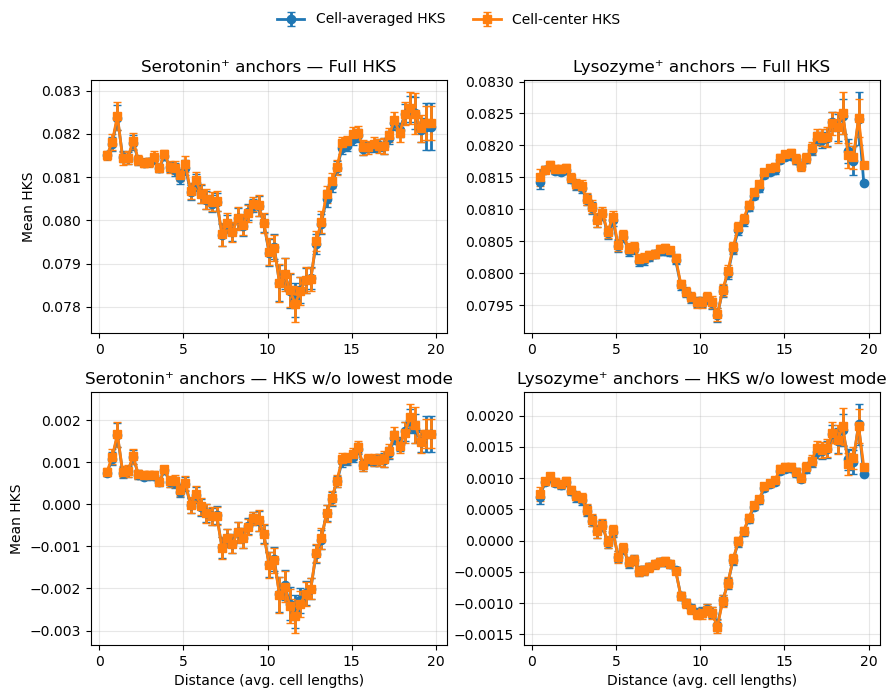

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(9, 7), sharex=False, sharey=False)

# === Top row: full HKS ===
# Serotonin
ax = axes[0, 0]
ax.errorbar(bin_centers, mean_hks_cellavg_ser, yerr=stderr_hks_cellavg_ser,
            fmt='-o', lw=2, capsize=3, label="Cell-averaged HKS")
ax.errorbar(bin_centers, mean_hks_center_ser, yerr=stderr_hks_center_ser,
            fmt='-s', lw=2, capsize=3, label="Cell-center HKS")
ax.set_title("Serotonin⁺ anchors — Full HKS")
ax.set_ylabel("Mean HKS")
ax.grid(True, alpha=0.3)

# Lysozyme
ax = axes[0, 1]
ax.errorbar(bin_centers, mean_hks_cellavg_lyso, yerr=stderr_hks_cellavg_lyso,
            fmt='-o', lw=2, capsize=3, label="Cell-averaged HKS")
ax.errorbar(bin_centers, mean_hks_center_lyso, yerr=stderr_hks_center_lyso,
            fmt='-s', lw=2, capsize=3, label="Cell-center HKS")
ax.set_title("Lysozyme⁺ anchors — Full HKS")
ax.grid(True, alpha=0.3)

# === Bottom row: HKS without lowest mode ===
# Serotonin
ax = axes[1, 0]
ax.errorbar(bin_centers, mean_hksnm_cellavg_ser, yerr=stderr_hksnm_cellavg_ser,
            fmt='-o', lw=2, capsize=3, label="Cell-averaged HKS (no l=0)")
ax.errorbar(bin_centers, mean_hksnm_center_ser, yerr=stderr_hksnm_center_ser,
            fmt='-s', lw=2, capsize=3, label="Cell-center HKS (no l=0)")
ax.set_title("Serotonin⁺ anchors — HKS w/o lowest mode")
ax.set_xlabel("Distance (avg. cell lengths)")
ax.set_ylabel("Mean HKS")
ax.grid(True, alpha=0.3)

# Lysozyme
ax = axes[1, 1]
ax.errorbar(bin_centers, mean_hksnm_cellavg_lyso, yerr=stderr_hksnm_cellavg_lyso,
            fmt='-o', lw=2, capsize=3, label="Cell-averaged HKS (no l=0)")
ax.errorbar(bin_centers, mean_hksnm_center_lyso, yerr=stderr_hksnm_center_lyso,
            fmt='-s', lw=2, capsize=3, label="Cell-center HKS (no l=0)")
ax.set_title("Lysozyme⁺ anchors — HKS w/o lowest mode")
ax.set_xlabel("Distance (avg. cell lengths)")
ax.grid(True, alpha=0.3)

# Shared legend (top center)
handles, labels = axes[0, 0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper center", ncol=2, frameon=False)

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()


### Local Field Statistics

The previous methods have all focused on non-local effects and neighborhoods around certain cells of interest. However, it is also useful to examine statistics of the fields (like HKS) only at the cells in question. Thus, we can compute the mean and standard deviation of one or more continuous fields for each marker-defined subset of cells. Optionally, if a graph $G$ and neighbor depth $k$ are provided, each cell’s field value is locally averaged over its $k$-nearest neighbors before computing the statistics.

For each marker $\mu$ and field $\alpha$, the local mean and standard deviation are

$$
\text{mean}^{(\mu,\alpha)} = \frac{1}{N_\mu} \sum_{i: m_i^{(\mu)} = 1} f_i^{(\alpha)}, \qquad
\text{std}^{(\mu,\alpha)} = \sqrt{\frac{1}{N_\mu} \sum_{i: m_i^{(\mu)} = 1} \left(f_i^{(\alpha)} - \text{mean}^{(\mu,\alpha)}\right)^2},
$$

where $m_i^{(\mu)} \in \{0,1\}$ indicates whether cell $i$ is positive for marker $\mu$, and $N_\mu$ is the number of such cells.

If $k>0$, each $f_i^{(\alpha)}$ is replaced by the weighted average over its $k$-hop neighborhood in $G$, providing a smoothed local context.


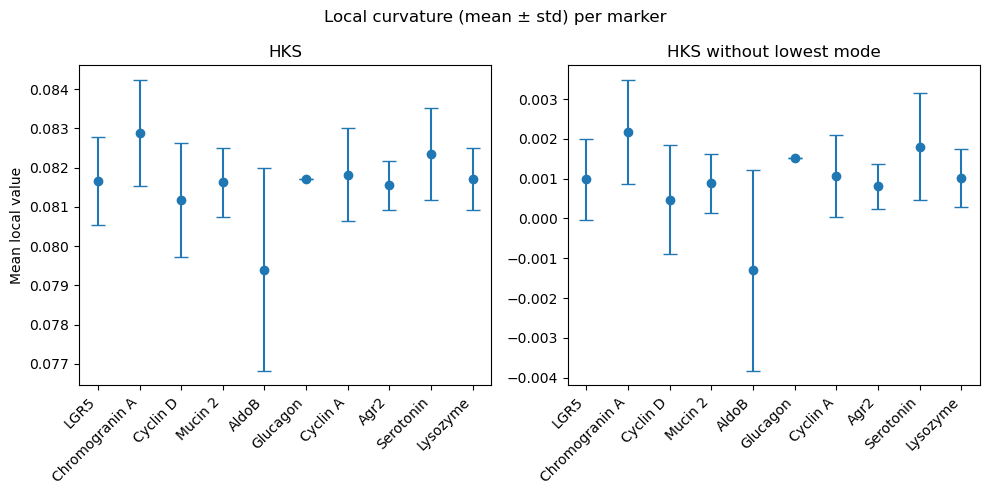

In [ ]:
means, stds, counts = local_field_statistics(fields_cell, markers_cell_binary)

fig, axes = plt.subplots(1, 2, figsize=(10,5), sharey=False)

fields_labels = ['HKS', 'HKS without lowest mode']

for f, ax in enumerate(axes):
    ax.errorbar(np.arange(len(mesh.marker_names)),
                means[:, f],
                yerr=stds[:, f],
                fmt='o', capsize=5)
    ax.set_xticks(np.arange(len(mesh.marker_names)))
    ax.set_xticklabels(mesh.marker_names, rotation=45, ha='right')
    ax.set_title(fields_labels[f])
    if f == 0:
        ax.set_ylabel("Mean local value")

fig.suptitle("Local curvature (mean ± std) per marker")
plt.tight_layout()
plt.show()


## Graph-based approches and $k$-nearest-neighbor analysis

Previously, we analyzed neighborhoods of cells in organoids in terms of **geodesic distances** between cell centers, which allowed us to compute radial profiles and enrichment curves as a function of distance. An alternative approach is to represent the organoid as a **graph**, where each vertex corresponds to a cell and edges connect neighboring cells, defined here as cells whose surface label patches are in contact. Once the organoid is represented as a graph, we can perform **k-nearest-neighbor (kNN) analyses** along the graph edges. 

For example, for cells positive for a given **focal marker**, we can compute the average composition of markers among their $k$ nearest neighbors:

$$
\text{avg\_comp}_m = \frac{1}{N_\text{focal}} \sum_{i \in \text{focal}} \frac{1}{k} \sum_{j \in \text{kNN}(i)} \mathbf{1}_{\text{cell } j \text{ positive for marker } m}
$$

where $N_\text{focal}$ is the number of cells positive for the focal marker, $\mathbf{1}$ is the indicator function, and $\text{kNN}(i)$ denotes the $k$ nearest neighbors of focal cell $i$ along the graph. This method allows us to quantify **local marker co-occurrence** directly in terms of cell adjacency, complementing the distance-based analyses.


In [ ]:
cell_graph = build_cell_graph(mesh)

marker_color = markers_cell_binary[:,8]  # e.g., 0/1 for serotonin+
plot_cell_graph_3D(centroids, cell_graph, node_color=marker_color)

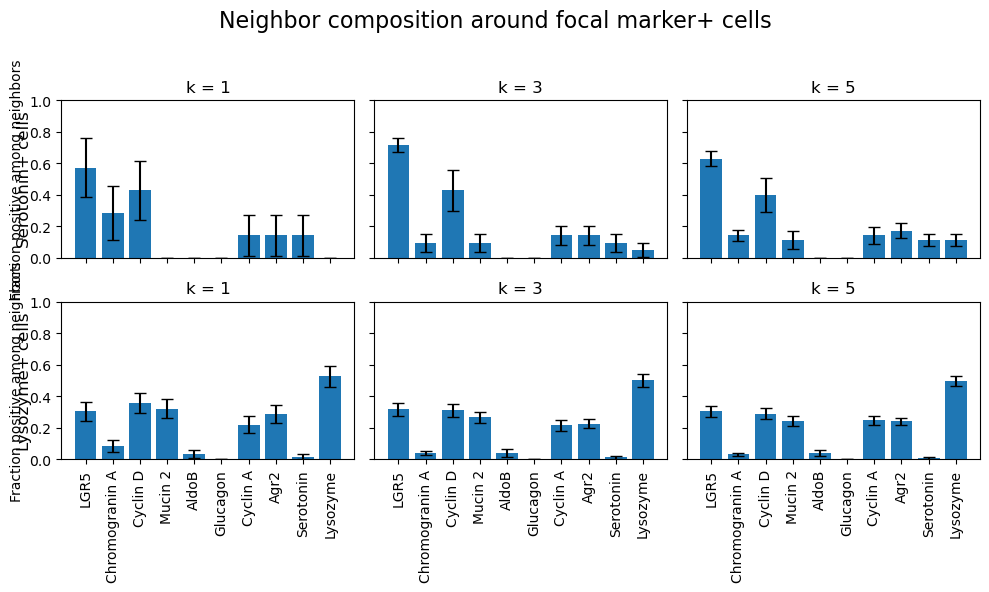

In [ ]:
# --- Markers to plot ---
focal_markers = ["Serotonin", "Lysozyme"]
marker_indices = [mesh.marker_names.index(name) for name in focal_markers]

k_values = [1, 3, 5]

fig, axes = plt.subplots(2, len(k_values), figsize=(10, 6), sharex=True, sharey=True)

for row_idx, focal_marker_idx in enumerate(marker_indices):
    for col_idx, k in enumerate(k_values):
        ax = axes[row_idx, col_idx]
        avg_comp, std_comp, sem_comp, comp_accum = kNN_marker_composition(
            cell_graph, markers_cell_binary, focal_marker_idx, k=k
        )
        ax.bar(range(len(mesh.marker_names)), avg_comp, yerr=sem_comp, capsize=4)
        ax.set_xticks(range(len(mesh.marker_names)))
        ax.set_xticklabels(mesh.marker_names, rotation=90)
        ax.set_ylim(0, 1)
        ax.set_title(f"k = {k}")
        if col_idx == 0:
            ax.set_ylabel("Fraction positive among neighbors")

# Add row labels
axes[0, 0].text(-0.15, 0.5, "Serotonin+ cells", va='center', rotation=90, transform=axes[0,0].transAxes, fontsize=12)
axes[1, 0].text(-0.15, 0.5, "Lysozyme+ cells", va='center', rotation=90, transform=axes[1,0].transAxes, fontsize=12)

plt.suptitle("Neighbor composition around focal marker+ cells", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


### Moran's I for Spatial Autocorrelation

Moran's I is a widely used measure of **spatial autocorrelation**, quantifying the degree to which values of a variable are similar among neighboring cells. For a variable $x$ defined over $N$ cells and a spatial weights matrix $W$ describing neighborhood relationships (e.g., adjacency, k-nearest neighbors, or distance-based), the **global Moran's I** is defined as:

$$
I = \frac{N}{S_0} \frac{\sum_{i=1}^N \sum_{j=1}^N W_{ij} (x_i - \bar{x})(x_j - \bar{x})}{\sum_{i=1}^N (x_i - \bar{x})^2}, \quad
S_0 = \sum_{i=1}^N \sum_{j=1}^N W_{ij},
$$

where $\bar{x}$ is the mean of $x$, and $S_0$ is the sum of all weights.  

- $I > 0$ indicates positive spatial clustering (cells with high values tend to be near other high values).  
- $I < 0$ indicates dispersion (high values near low values).  
- $I \approx 0$ indicates no spatial structure beyond random chance.  

The **local Moran's I** measures autocorrelation around each cell:

$$
I_i^\text{local} = \frac{(x_i - \bar{x})}{\sigma^2} \sum_{j=1}^N W_{ij} (x_j - \bar{x}), \quad
\sigma^2 = \frac{1}{N} \sum_{i=1}^N (x_i - \bar{x})^2
$$

#### Cross-Moran's I

Moran's I can be extended to **cross-Moran's I**, which quantifies the spatial correlation between two distinct variables $x$ and $y$:

$$
I^{XY} = \frac{N}{S_0} \frac{\sum_{i=1}^N \sum_{j=1}^N W_{ij} (x_i - \bar{x})(y_j - \bar{y})}{\sum_{i=1}^N (x_i - \bar{x})^2}
$$

Local cross-Moran's I can also be computed per cell to identify local neighborhoods where $x$ and $y$ are spatially correlated.

#### Permutation Testing

To assess statistical significance, we can perform **permutation tests**: the cell values of $x$ or $y$ are randomly shuffled many times, computing (cross-)Moran's I for each permutation. Empirical p-values are then obtained as:

$$
p = \frac{1}{n_\text{perms}} \sum_{k=1}^{n_\text{perms}} \mathbf{1}\big(|I_\text{perm}^{(k)}| \ge |I_\text{obs}|\big)
$$

This tests whether the observed spatial autocorrelation is stronger than expected by chance.

#### Choice of Weight Matrix

The definition of neighbors via the **weight matrix $W$** strongly influences (cross-)Moran's I:

- **k-nearest neighbors (kNN):** Only the closest $k$ neighbors contribute; commonly $k=1$ for direct adjacency.
- **Graph adjacency:** Cells sharing a boundary or patch are considered neighbors.
- **Distance-based:** Exponentially decaying weights can be used to include all cells with influence decreasing with distance.

Different weighting schemes capture spatial structure at different scales and affect both the magnitude and interpretability of Moran's I. Row-standardization of $W$ ensures comparability across cells with different numbers of neighbors.


### Permutation Testing for Moran's I and Cross-Moran's I

Permutation tests are a **non-parametric approach** to assess the statistical significance of spatial autocorrelation measures such as Moran's I or cross-Moran's I. The basic idea is to compare the observed value of Moran's I against a distribution of values obtained under the null hypothesis of **no spatial structure**, generated by randomly permuting the data.

#### 1. Permutation Test for Global Moran's I

For a single variable $x$ defined over $N$ cells:

1. Compute the observed global Moran's I, $I_\text{obs}$, using the original field and weight matrix $W$:

$$
I_\text{obs} = \frac{N}{S_0} \frac{\sum_{i,j} W_{ij} (x_i - \bar{x})(x_j - \bar{x})}{\sum_i (x_i - \bar{x})^2}, \quad S_0 = \sum_{i,j} W_{ij}
$$

2. Perform $n_\text{perms}$ **permutations** of the variable $x$:

   - **What changes:** The values of $x$ (the binary labels of positive expression) are randomly shuffled across the cells.
   - **What remains constant:** The spatial weights $W$ and the identity/position of each cell remain fixed.

3. For each permutation $k$, compute Moran's I:

$$
I_\text{perm}^{(k)} = \frac{N}{S_0} \frac{\sum_{i,j} W_{ij} (x_i^\text{perm} - \bar{x}^\text{perm})(x_j^\text{perm} - \bar{x}^\text{perm})}{\sum_i (x_i^\text{perm} - \bar{x}^\text{perm})^2}
$$

4. Compute the empirical p-value as the fraction of permutations where the absolute permuted Moran's I exceeds the observed value:

$$
p = \frac{1}{n_\text{perms}} \sum_{k=1}^{n_\text{perms}} \mathbf{1}\left(|I_\text{perm}^{(k)}| \ge |I_\text{obs}|\right)
$$

This tests the null hypothesis that the observed spatial autocorrelation could arise by chance given the same network of neighbors.

#### 2. Permutation Test for Cross-Moran's I

For two variables $x$ and $y$:

1. Compute the observed **cross-Moran's I**:

$$
I_\text{obs}^{XY} = \frac{N}{S_0} \frac{\sum_{i,j} W_{ij} (x_i - \bar{x})(y_j - \bar{y})}{\sum_i (x_i - \bar{x})^2}
$$

2. Permute **only one variable** (typically $y$):

   - **What changes:** The values of $y$ are shuffled across cells, destroying any spatial correlation between $x$ and $y$.
   - **What remains constant:** The values of $x$, the cell identities, and the weight matrix $W$.

3. Compute cross-Moran's I for each permuted $y$:

$$
I_\text{perm}^{XY,(k)} = \frac{N}{S_0} \frac{\sum_{i,j} W_{ij} (x_i - \bar{x})(y_j^\text{perm} - \bar{y}^\text{perm})}{\sum_i (x_i - \bar{x})^2}
$$

4. Empirical p-values are calculated similarly:

$$
p = \frac{1}{n_\text{perms}} \sum_{k=1}^{n_\text{perms}} \mathbf{1}\left(|I_\text{perm}^{XY,(k)}| \ge |I_\text{obs}^{XY}|\right)
$$

#### 3. Key Considerations

- **Permutation definition:** The permutation procedure preserves the spatial structure (the neighbor network defined by $W$) and the values of other fields not being permuted. Only the field(s) being tested are shuffled.
- **Choice of $W$ matters:** For example, using $k$-nearest neighbors vs. distance-decay weights will change which cells are considered “neighbors” and therefore the null distribution of Moran's I.
- **Interpretation:** A low p-value indicates that the observed spatial autocorrelation (or cross-correlation) is unlikely to occur by random assignment of values, supporting the presence of non-random spatial structure.

Permutation tests are especially important for cross-Moran's I because the joint distribution of two markers across a network can be complex, and analytical p-values are generally not available.


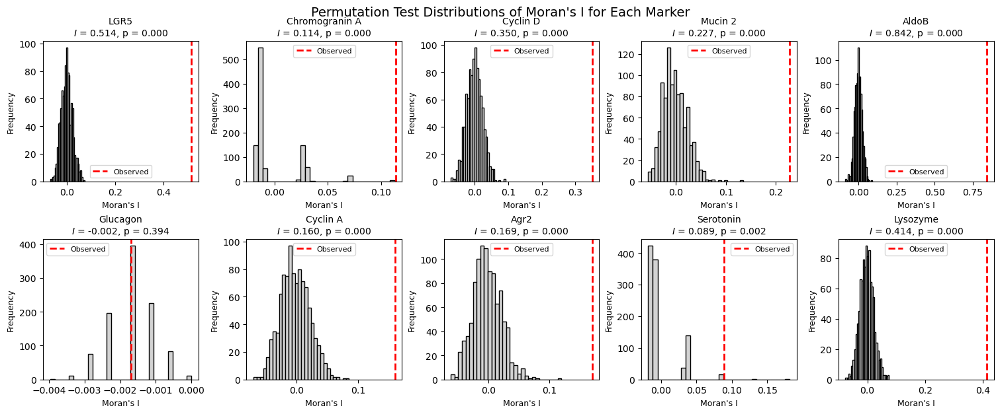

In [ ]:
# Build weight matrix from graph (k=1 means nearest-neighbor)
W, nodes = build_weight_matrix_kNN(cell_graph, k=1, row_standardize=False)

# Run Moran’s I permutation test
global_I_obs, local_I_obs, global_I_perm, p_values = permutation_test_morans_I(
    markers_cell_binary, W, n_perms=999, seed=42
)

M = len(mesh.marker_names)
ncols = int(np.ceil(M / 2))
nrows = int(np.ceil(M / ncols))

fig, axes = plt.subplots(nrows, ncols, figsize=(3*ncols, 3*nrows), constrained_layout=True)
axes = axes.flatten()

for j in range(M):
    perm_data = global_I_perm[:, j]
    perm_data = perm_data[~np.isnan(perm_data)]
    obs_value = global_I_obs[j]

    ax = axes[j]
    if len(perm_data) > 0:
        ax.hist(perm_data, bins=30, color="lightgray", edgecolor="black")
        ax.axvline(obs_value, color="red", linestyle="--", lw=2, label="Observed")
    ax.set_title(f"{mesh.marker_names[j]}\n$I$ = {obs_value:.3f}, p = {p_values[j]:.3f}", fontsize=10)
    ax.set_xlabel("Moran's I", fontsize=9)
    ax.set_ylabel("Frequency", fontsize=9)
    ax.legend(fontsize=8)

# Remove unused subplots if M is not a perfect square
for j in range(M, len(axes)):
    fig.delaxes(axes[j])

fig.suptitle("Permutation Test Distributions of Moran's I for Each Marker", fontsize=14, y=1.02)
plt.show()


Each subplot shows the distribution of Moran's I values obtained by **permuting the cell labels** for a single marker while keeping the spatial weight matrix $W$ fixed. The histogram (gray) represents the null distribution under random labeling, and the red dashed line indicates the **observed Moran's I** for the actual spatial configuration of the marker. Recall that

- $I > 0$ indicates positive spatial clustering (cells with high values tend to be near other high values).  
- $I < 0$ indicates dispersion (high values near low values).  
- $I \approx 0$ indicates no spatial structure beyond random chance.  

The empirical **p-value** is computed as the fraction of permuted Moran’s I values whose magnitude is at least as extreme as the observed value. Small p-values indicate that the observed spatial autocorrelation is **unlikely to occur by chance**, given the weight matrix.  

> Note: The choice of weight matrix $W$ affects the scale and interpretation of Moran’s I. Here, nearest-neighbor adjacency (k=1) is used, but other schemes (e.g., kNN, distance-decay) can emphasize different spatial scales.


In [ ]:
# --- Markers to plot ---
focal_markers = ["LGR5", "Serotonin", "Lysozyme"]
marker_indices = [mesh.marker_names.index(name) for name in focal_markers]


for j, marker in enumerate([mesh.marker_names[i] for i in marker_indices]):
    node_color = local_I_obs[:, j]
    node_color = np.nan_to_num(node_color)  # replace NaN with 0 for plotting
    fig = go.Figure()
    edge_x, edge_y, edge_z = [], [], []
    for i, k in cell_graph.edges():
        edge_x += [centroids[i, 0], centroids[k, 0], None]
        edge_y += [centroids[i, 1], centroids[k, 1], None]
        edge_z += [centroids[i, 2], centroids[k, 2], None]
    edge_trace = go.Scatter3d(x=edge_x, y=edge_y, z=edge_z, mode='lines', line=dict(width=1, color='gray'))
    node_trace = go.Scatter3d(
        x=centroids[:, 0], y=centroids[:, 1], z=centroids[:, 2],
        mode='markers',
        marker=dict(size=5, color=node_color, colorscale='RdBu_r', colorbar=dict(title=f"Local Moran's I ({marker})")),
        text=[f"Cell {i}" for i in range(len(centroids))], hoverinfo='text'
    )
    fig.add_trace(edge_trace)
    fig.add_trace(node_trace)
    fig.update_layout(title=f"Local Moran's I for {marker}", scene=dict(aspectmode='data'))
    fig.show()


In [ ]:
# Compute cross-Moran's I with permutations for all markers
n_perms = 999
global_I_obs, local_I_obs, global_I_perm, p_values = permutation_test_morans_I(
    markers_cell_binary, W, Y=markers_cell_binary, n_perms=n_perms, seed=42
)

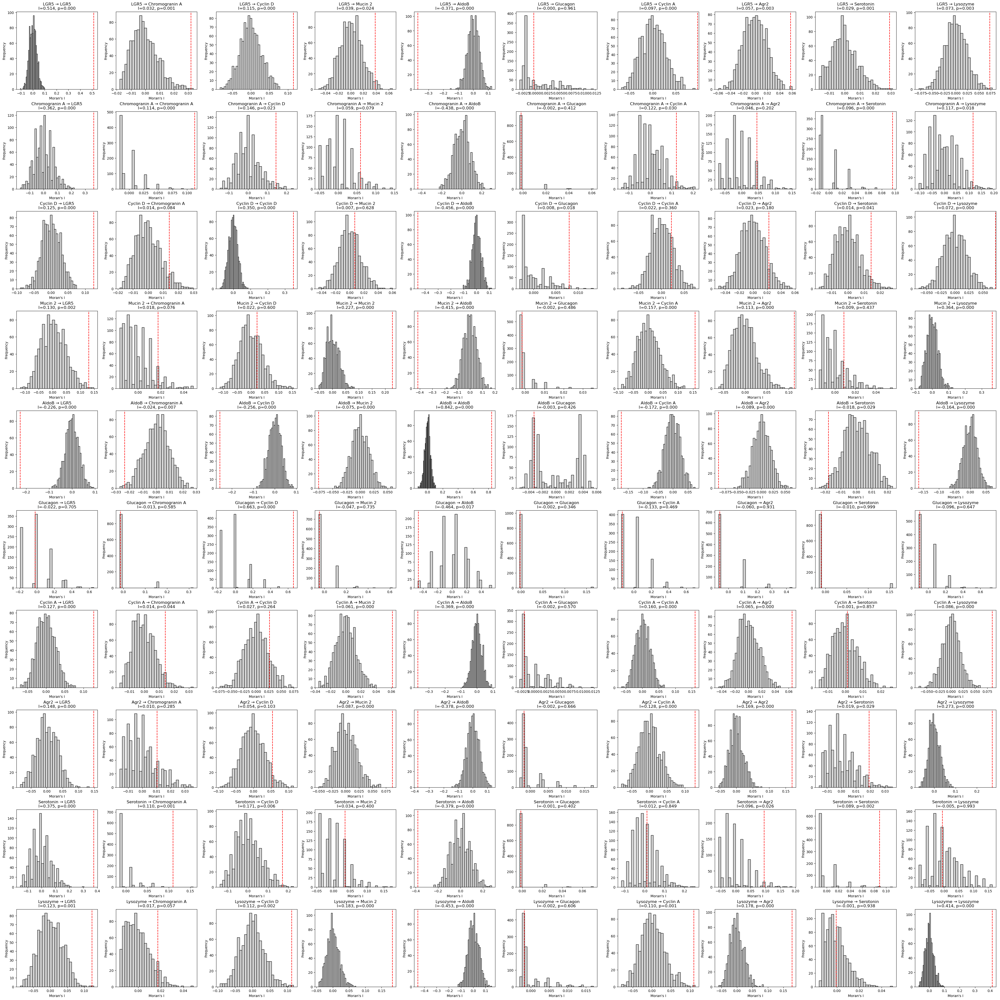

In [ ]:
M = len(mesh.marker_names)
fig, axes = plt.subplots(M, M, figsize=(4*M, 4*M), constrained_layout=True)
for i in range(M):
    for j in range(M):
        ax = axes[i, j] if M > 1 else axes
        perm_data = global_I_perm[:, i, j]
        perm_data = perm_data[~np.isnan(perm_data)]
        obs_value = global_I_obs[i, j]
        if len(perm_data) > 0:
            ax.hist(perm_data, bins=30, color="lightgray", edgecolor="black")
            ax.axvline(obs_value, color="red", linestyle="--")
        ax.set_title(f"{mesh.marker_names[i]} → {mesh.marker_names[j]}\nI={obs_value:.3f}, p={p_values[i,j]:.3f}")
        ax.set_xlabel("Moran's I")
        ax.set_ylabel("Frequency")
plt.show()
